# Feature Exploration

Given `flight_history.csv`, I will first do some general EDA to discover potential trends and relationships between variables.

In [1]:
# Modules
import numpy as np
import pandas as pd
import os
from ydata_profiling import ProfileReport
from plotnine import *
from pathlib import Path
from utils import find_percent, plot_cdf

# Formatting
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### Creating `lateflight` in `flight_history.csv`

Our goal is to predict if a flight is late, given by the marker in the `lateflight` variable in `flight_test.csv`. However, `flight_history.csv` doesn't have this column. We create the variable by using the `arr_delay` column where if it's positive, we give it a 1, otherwise it's a 0. This column contains how late the flight lands. 

In [2]:
# Pull in data
raw_data = pd.read_csv(Path(os.getcwd()).parents[0].joinpath("data", "flight_history.csv"))

# Create a "lateflight" variable
raw_data["lateflight"] = np.where(raw_data["arr_delay"] > 0, 1, 0)

In [3]:
# General EDA
print(raw_data.describe())

           year          month            day       dep_time  sched_dep_time  \
count  166158.0  166158.000000  166158.000000  161275.000000   166158.000000   
mean     2013.0       3.551836      15.642515    1351.740567     1346.872128   
std         0.0       1.699779       8.724071     490.410054      468.257735   
min      2013.0       1.000000       1.000000       1.000000      500.000000   
25%      2013.0       2.000000       8.000000     909.000000      909.000000   
50%      2013.0       4.000000      16.000000    1407.000000     1400.000000   
75%      2013.0       5.000000      23.000000    1748.000000     1730.000000   
max      2013.0       6.000000      31.000000    2400.000000     2359.000000   

           dep_delay       arr_time  sched_arr_time     arr_delay  \
count  161275.000000  161057.000000   166158.000000  160678.00000   
mean       13.715666    1503.949024     1539.488595       8.15129   
std        41.677452     536.363552      498.562131      46.00005   
min

In [4]:
# Profile Report
profile = ProfileReport(raw_data, title="Flight History Profile Report", explorative=True)
profile.to_file("flight_history_feature_eda.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
# Or run as follows:
profile.to_notebook_iframe()

## `flight_history_eda.ipynb` Analysis

The `ProfileReport` gives some great insights on the first pass, sharing the number of variables (20 including `lateflight`), observations (166158), categorical (4) and numerical (13) columns, text (2) columns, date (1) columns, and ways to analyze missing cells. We create a `lateflight` column in this dataset by using the `arr_delay` column, where if the value is positive, it's marked as late.

From the correlation plot, there doesn't seem to be any strong relationships between `lateflight` and any other column. Let's dig deeper into this to see if we can create any categorical variables from these numerical columns.

### Columns to ignore

- `year` is 1 value (2013)

### Concerns to watch for
- `flight_test.csv` has flights for the month of July, but this dataset only has flights from Jan-June
- Make sure to disregard duplicate date/time columns
- When building the model, make sure to remove some date/time columns
- Ensure interesting columns are also present in the `flight_test.csv` dataset

### Variables of interest
- `carrier` (16 distinct) could have some correlation for late flights
- `origin` (3 distinct) or `dest` (100 distinct) could also be another factor
- Greater `distance` could lead to more late arrivals

## `lateflight` EDA

From the EDA above, with how we define a `lateflight`, 67370 of 166158 flights are late, resulting in a percentage of ~40.5% of flights. This is pretty high, considering that a quick Google/Bing search says that about 20-25% of flights are late.

Question: could this be due to more winter flights? While our test data is in July?

### Late by How Much?

It's possible that I'm being too stingy in deciding how to select flights that are "late". Let's check the distribution of how many flights are late by certain benchmarks.

In [4]:
# Assuming the dataframe is named "flights" and the column for how late a flight was is named "delay"
# and the column stating whether the flight was late or not is named "late"

# Create a new column for the time interval
raw_data['time_interval'] = pd.cut(raw_data['arr_delay'], bins=[-float('inf'), 5, 15, 30, 60, 120, float('inf')], labels=['<5', '5-15', '15-30', '30-60', '60-120', '>120'])

# Group the flights by the time interval and count the number of flights that are late in each group
late_flights_by_interval = raw_data[raw_data['lateflight'] == True].groupby('time_interval').size() / sum(raw_data["lateflight"])

# Print the result
print(late_flights_by_interval.round(3))

time_interval
<5        0.170
5-15      0.236
15-30     0.193
30-60     0.182
60-120    0.139
>120      0.079
dtype: float64


From the dataframe above, we see that about 17% of late flights are late by less than 5 minutes, about 40% are late by less than 15 minutes, and about 60% are late by under 30 minutes. It's pretty rare (~7.9%) for a flight to be late by over 120 minutes.

## Grouping Variables

For this section, we'll be seeing if certain variables could be made into categories that better connect late flights to that variable.

### Month

Does time of month impact how late a flight might be? If so, it might be unfair to include certain winter months in the model.

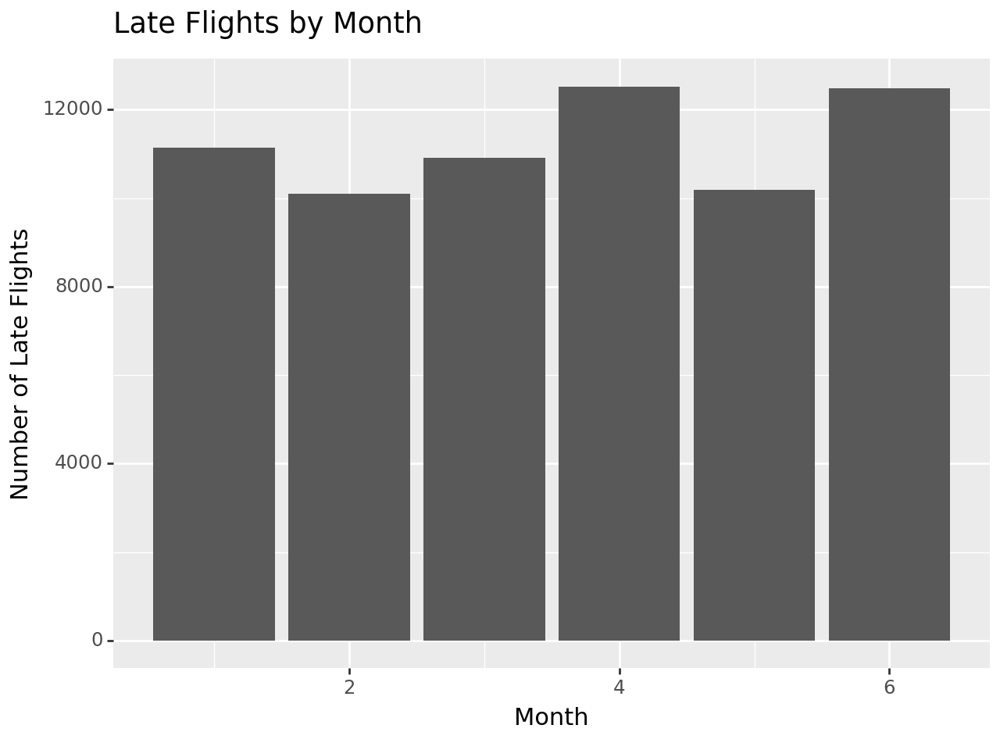

<Figure Size: (640 x 480)>

In [5]:

(
 ggplot(raw_data, aes(x="month", y="lateflight"))
 + geom_bar(stat="identity")
 + labs(title="Late Flights by Month", x="Month", y="Number of Late Flights")
)

In [6]:
find_percent(raw_data, "month", "lateflight")

,sum,count,percent_late
month,,,
1,11150,27004,41.290
2,10100,24951,40.479
3,10919,28834,37.868
4,12522,28330,44.200
5,10189,28796,35.383
6,12490,28243,44.223


### Departure Time

Does the hour of departure impact the likelihood of a flight being late?


In [7]:
find_percent(raw_data, "hour", "lateflight")

,sum,count,percent_late
hour,,,
5,298,938,31.770
6,3905,13109,29.789
7,3047,11029,27.627
8,4448,13071,34.030
9,3542,10318,34.328
10,2786,7919,35.181
11,2812,7926,35.478
12,3310,8783,37.686
13,4138,9726,42.546


Yes, there's clearly a relationship between scheduled flight hour and the probability of a flight being late. Late flights (after noon) tend to have averages > 40%, and flights after 3PM have an average lateness >45%.

Also note that the earliest flights are at 5AM, and the latest flights around 11PM. It's odd to see that flights around 5&6 have a higher percentage of lateness compared to 7AM flights, but this could be because red eye flights are late?

### Arrival Time

We see that departure time can influence whether a flight is late or not. But what about arrival time?

In [46]:
raw_data["sched_arr_hr"] = raw_data["sched_arr_time"] // 100

find_percent(raw_data, "sched_arr_hr", "lateflight")

,sum,count,percent_late
sched_arr_hr,,,
0,1091,2136,51.077
1,144,288,50.000
2,60,115,52.174
3,175,371,47.170
4,73,165,44.242
6,128,407,31.450
7,799,2936,27.214
8,2228,7020,31.738
9,2977,9686,30.735


In [48]:
# Find correlation between flight departure and flight arrival
correlation = raw_data["sched_arr_hr"].corr(raw_data["hour"])
print(round(correlation, 3))


0.777


As expected, we do see that there is a relationship between likelihood a flight is late and scheduled arrival time. However, note the high correlation between scheduled flight departure and scheduled flight arrival (duh). 

### Distance and Late Flights

Is there a relationship between how long a flight is (next we'll look at scheduled air time) and if the flight arrived late?

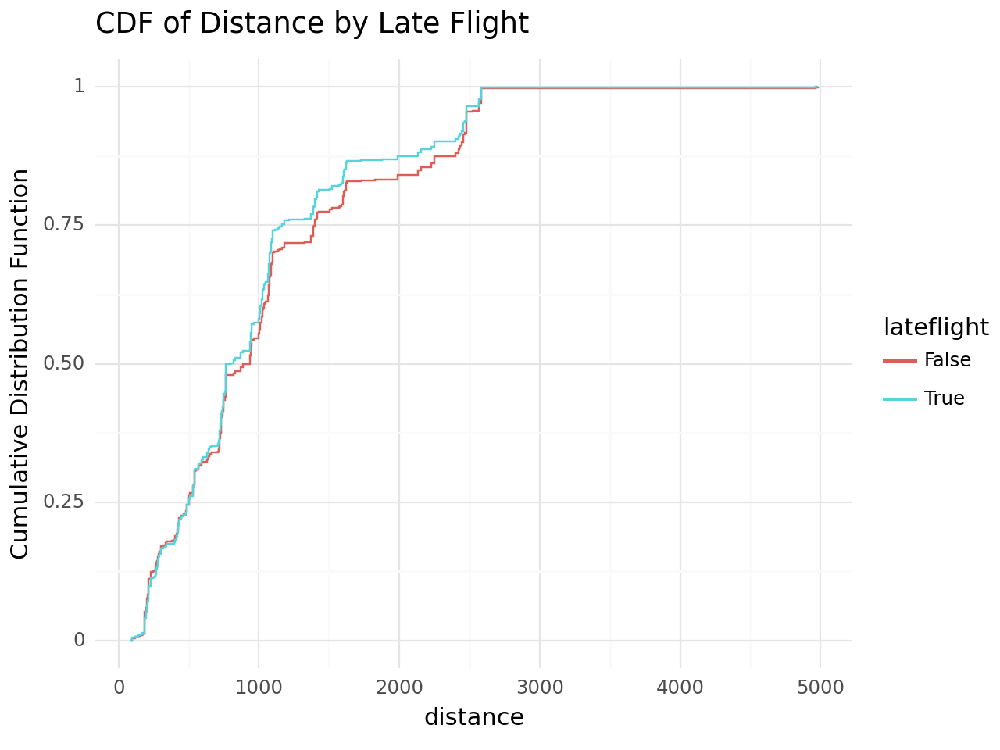

In [9]:
# Change lateflight to be a string
data_cat_lf = raw_data.copy()
data_cat_lf["lateflight"] = data_cat_lf["lateflight"].astype(bool)

plot_cdf(data_cat_lf, "distance", "lateflight", "CDF of Distance by Late Flight")

Surprisingly, we see that flights that are late have almost identical distances to flights that aren't late, if not slightly less in distance.

### Air time and Late Flight

Given the graph above, I'm guessing that there aren't too many differences, but good to check if a plane that has to fly longer results in a flight that's later.

c:\Users\geddy\Documents\GitHub\ln-flight-analysis\venv\lib\site-packages\plotnine\layer.py:284: PlotnineWarning: stat_ecdf : Removed 5480 rows containing non-finite values.


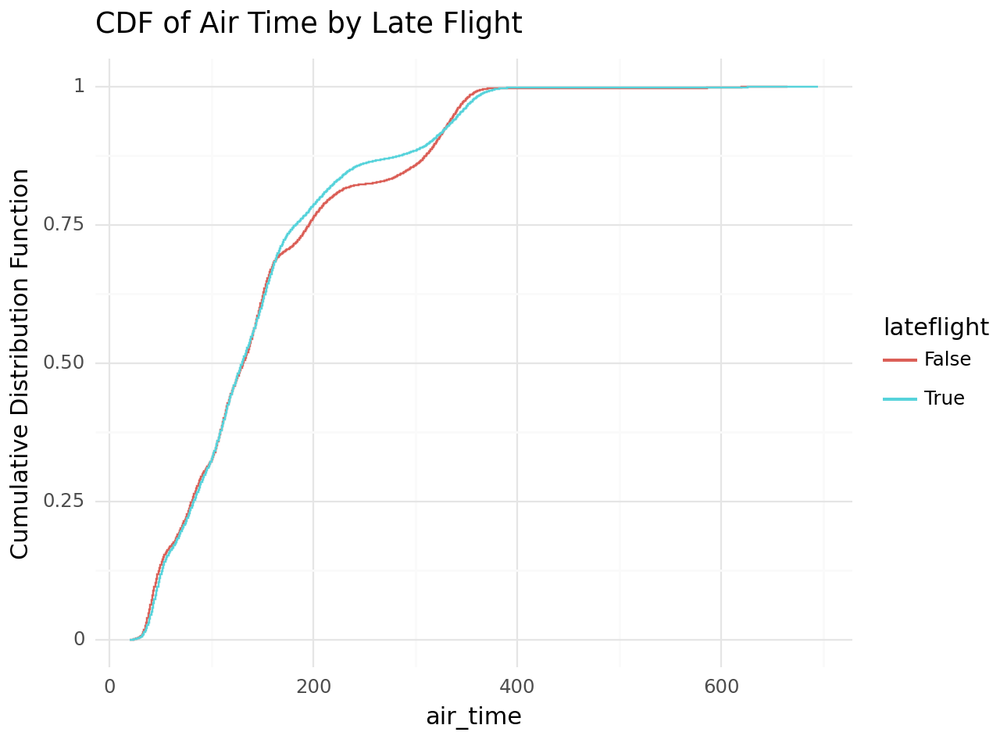

In [11]:
plot_cdf(data_cat_lf, "air_time", "lateflight", "CDF of Air Time by Late Flight")

Again, we see that longer air time doesn't necessarily result in late flights.

### Origin and Destination vs. Late Flights

Does the origin airport or destination airport impact if a flight will be late? Note that all flights are flying from a NY airport to another airport.

In [19]:
print(find_percent(raw_data, "origin", "lateflight"))
print(find_percent(raw_data, "dest", "lateflight"))

          sum  count  percent_late
origin                            
EWR     26605  60718        43.817
JFK     21378  55366        38.612
LGA     19387  50074        38.717
       sum  count  percent_late
dest                           
ABQ     27     70        38.571
ACK     25     64        39.062
ALB    132    285        46.316
ATL   3850   8538        45.093
AUS    538   1225        43.918
AVL     27     80        33.750
BDL    114    311        36.656
BGR     32     88        36.364
BHM     54    154        35.065
BNA   1329   2921        45.498
BOS   2405   7695        31.254
BQN    226    490        46.122
BTV    593   1412        41.997
BUF    926   2317        39.965
BUR     87    187        46.524
BWI    437   1087        40.202
BZN      8     16        50.000
CAE     40     52        76.923
CAK    211    442        47.738
CHO      9     31        29.032
CHS    551   1204        45.764
CLE    934   2421        38.579
CLT   2964   6671        44.431
CMH    713   1692        

Firstly, we see that the `origin` airport has some impact on whether a flight is late or not, as EWR has a slightly higher percentage of late flights. However, when looking at destination airports, we clearly see that there is a huge amount of variation w.r.t. the proportion of late flights.

### Carrier and Late Flight

Is there a relationship between the carrier and if a flight will be late?

In [49]:
find_percent(raw_data, "carrier", "lateflight")

,sum,count,percent_late
carrier,,,
9E,3319,9069,36.597
AA,5439,16380,33.205
AS,116,362,32.044
B6,12028,27017,44.520
DL,8054,23623,34.094
EV,13231,26558,49.819
F9,193,335,57.612
FL,997,1828,54.540
HA,40,181,22.099


Yes! Some carriers have seen higher rates of late flights! We can turn this into a categorical variable potentially.